In [2]:
import os
import subprocess
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import xarray
import datetime

# read in the sentinel 2 data
s2_data = xarray.open_dataset('geo_data/cali_training.nc')
s2_data

<xarray.Dataset>
Dimensions:      (band: 10, date: 26, x: 994, y: 940)
Coordinates:
  * band         (band) object 'B02' 'B03' 'B04' 'B05' ... 'B8A' 'B11' 'B12'
  * date         (date) datetime64[ns] 2016-12-18 2017-02-16 ... 2019-01-22
Dimensions without coordinates: x, y
Data variables:
    reflectance  (y, x, band, date) uint16 ...
    mask         (y, x) bool ...
    SCL          (y, x, date) uint16 ...
Attributes:
    transform:  [ 1.0000e+01  0.0000e+00  3.3092e+05  0.0000e+00 -1.0000e+01 ...
    crs:        +init=epsg:32618

The above text string describes the xarray object containing all of the image data. Note the dimensions field:

In [3]:
s2_data.transform.reshape(3,2)

array([[ 1.0000e+01,  0.0000e+00],
       [ 3.3092e+05,  0.0000e+00],
       [-1.0000e+01,  3.6996e+05]])

In [4]:
s2_data.SCL.sel(date='2016-12-18')

<xarray.DataArray 'SCL' (y: 940, x: 994)>
[934360 values with dtype=uint16]
Coordinates:
    date     datetime64[ns] 2016-12-18
Dimensions without coordinates: y, x

In [30]:
for b in s2_data.date:
    print(b.values)

2016-12-18T00:00:00.000000000
2017-02-16T00:00:00.000000000
2017-04-27T00:00:00.000000000
2017-06-06T00:00:00.000000000
2017-07-16T00:00:00.000000000
2017-12-18T00:00:00.000000000
2018-01-07T00:00:00.000000000
2018-02-26T00:00:00.000000000
2018-04-07T00:00:00.000000000
2018-06-21T00:00:00.000000000
2018-07-01T00:00:00.000000000
2018-07-11T00:00:00.000000000
2018-07-16T00:00:00.000000000
2018-07-26T00:00:00.000000000
2018-08-20T00:00:00.000000000
2018-09-19T00:00:00.000000000
2018-09-29T00:00:00.000000000
2018-10-04T00:00:00.000000000
2018-10-14T00:00:00.000000000
2018-12-03T00:00:00.000000000
2018-12-18T00:00:00.000000000
2018-12-28T00:00:00.000000000
2019-01-02T00:00:00.000000000
2019-01-12T00:00:00.000000000
2019-01-17T00:00:00.000000000
2019-01-22T00:00:00.000000000


In [2]:
s2_data.dims

Frozen(SortedKeysDict({'y': 940, 'x': 994, 'band': 10, 'date': 26}))

This provides the size of each dimension: for example we can see there are [10 Sentinel 2 bands](https://earth.esa.int/web/sentinel/technical-guides/sentinel-2-msi/msi-instrument) over 26 date points. Note there are also 3 kinds of data variables of which 2 are important: 'reflectance' and 'SCL'. The reflectance bands are the Sentinel 2 reflectance values and the SCL is the [Scene Classification Layer](https://earth.esa.int/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm)

In [8]:
# make a list of dates
dates = [str(x.values)[:10] for x in s2_data.date]
print('Image dates: '+', '.join(dates))

Image dates: 2016-12-18, 2017-02-16, 2017-04-27, 2017-06-06, 2017-07-16, 2017-12-18, 2018-01-07, 2018-02-26, 2018-04-07, 2018-06-21, 2018-07-01, 2018-07-11, 2018-07-16, 2018-07-26, 2018-08-20, 2018-09-19, 2018-09-29, 2018-10-04, 2018-10-14, 2018-12-03, 2018-12-18, 2018-12-28, 2019-01-02, 2019-01-12, 2019-01-17, 2019-01-22


The code below calculates the NDVI (see [this notebook](../tutorials/1.%20Optical%20satellite%20imagery.ipynb) for more details) and plots it using matplotlib:

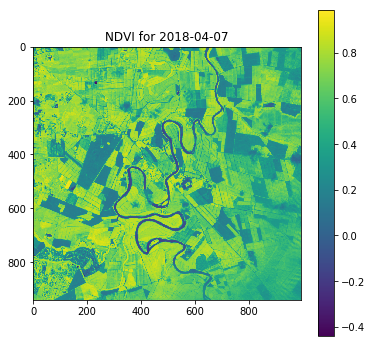

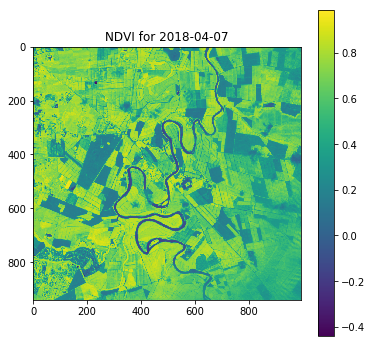

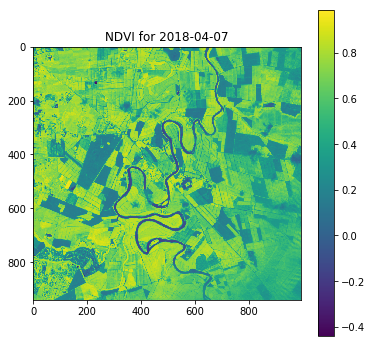

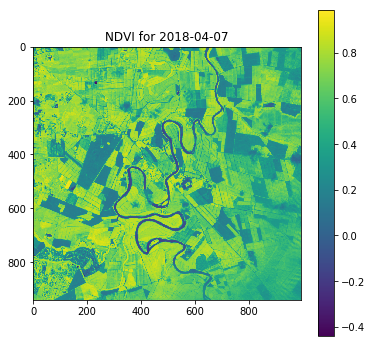

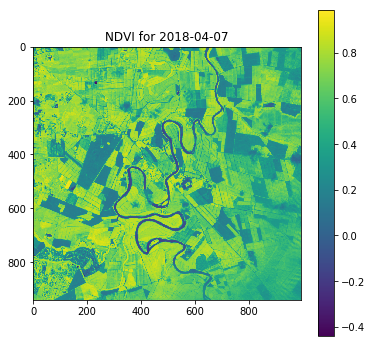

...

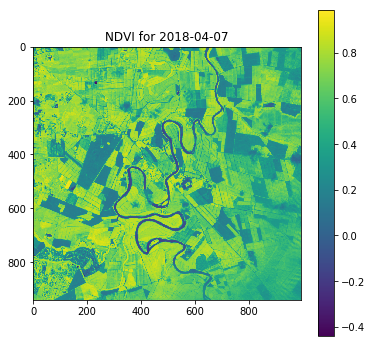

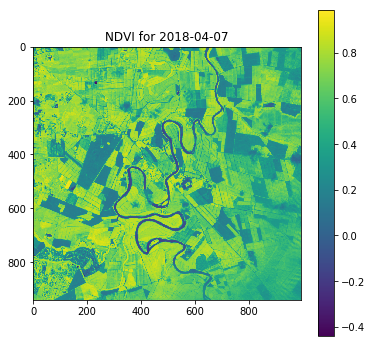

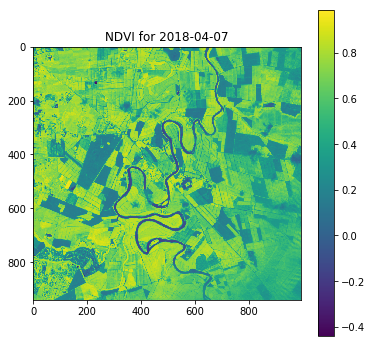

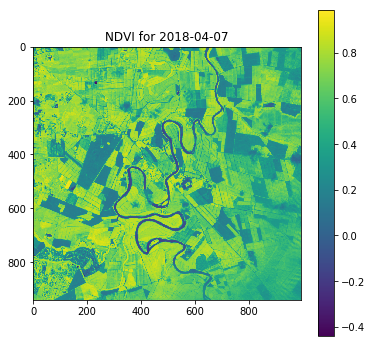

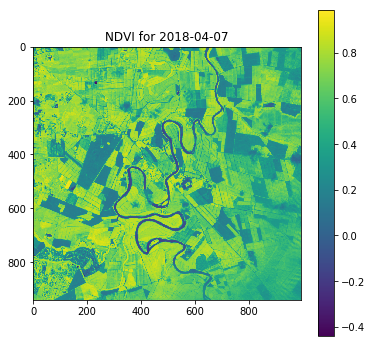

In [53]:
def NDVI(reflectance_array):
    """ takes an xarray.DataArray object with the a 'band' coordinate dimension
    and returns an xarray.DataArray of NDVI values"""
    # be careful when calculating indices using the integer arrays
    # usually representing raster data. Explicitly convert to floats
    # for division.
    r = np.array(reflectance_array.sel(band='B04'),dtype='float')
    ir = np.array(reflectance_array.sel(band='B08'),dtype='float')
    return xarray.DataArray((ir-r)/(ir+r))

# choose a datet index:
d_idx = 8
for i in range(len(s2_data.date.values)):
    if '2018' in str(s2_data.date.values[i]): 
        plt.figure(figsize =(6,6))
        plt.title('NDVI for {}'.format(dates[d_idx]))
        plt.imshow(NDVI(s2_data.reflectance.isel(date=d_idx)),cmap='viridis')
        plt.colorbar()
        plt.show()

/home/santiago/anaconda3/envs/medellin/lib/python3.6/site-packages/ipykernel_launcher.py:6: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  


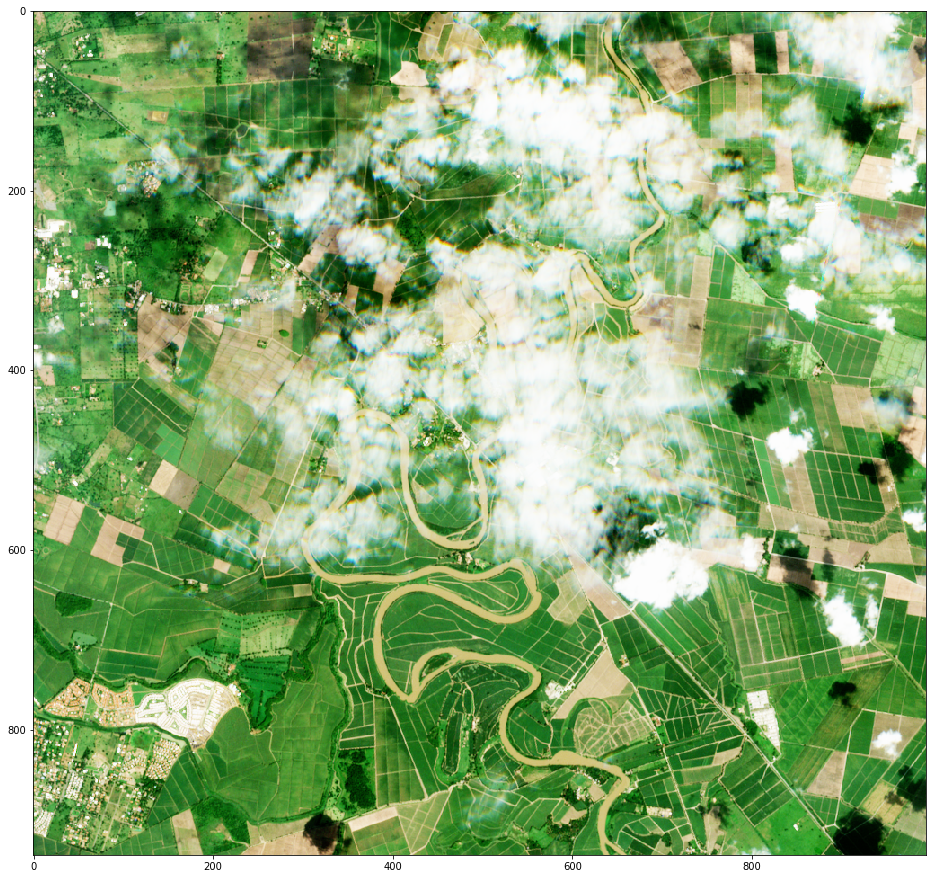

In [75]:
def image_histogram_equalization(image):
    """ Image histogram equlisation"""
    # from http://www.janeriksolem.net/2009/06/histogram-equalization-with-python-and.html

    # get image histogram
    image_histogram, bins = np.histogram(image.flatten(), 256, normed=True)
    cdf = image_histogram.cumsum() # cumulative distribution function
    cdf = (255-1) * cdf / cdf[-1] # normalize

    # use linear interpolation of cdf to find new pixel values
    image_equalized = np.interp(image.flatten(), bins[:-1], cdf)
    
    if len(image.shape) == 3:
        return image_equalized.reshape(image.shape).astype('uint8')[:,:,::-1]
    else:
        return image_equalized.reshape(image.shape).astype('uint8')

plt.figure(figsize=(16,16))
plt.imshow(image_histogram_equalization(s2_data.reflectance.sel(band=['B02', 'B03', 'B04']).isel(date=0).values/10000))

In [50]:
str(s2_data.date.values[0])

'2016-12-18T00:00:00.000000000'

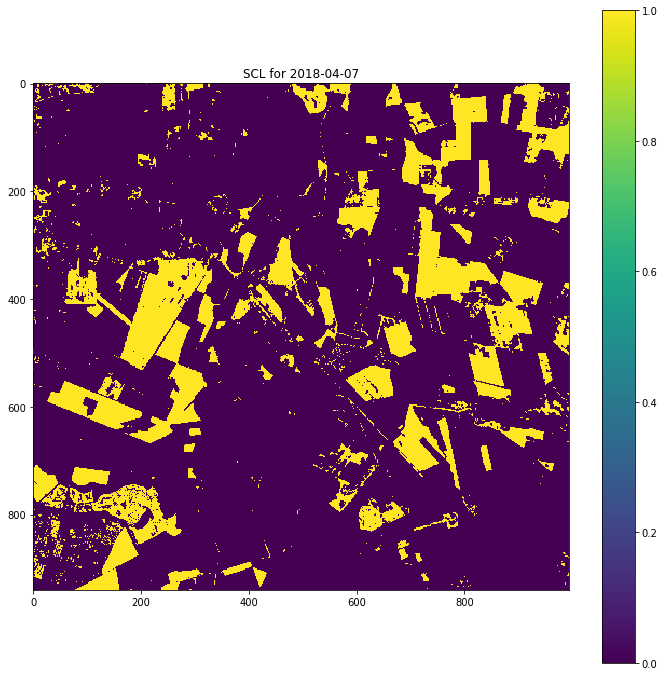

In [40]:
plt.figure(figsize =(12,12))
plt.title('SCL for {}'.format(dates[d_idx]))
plt.imshow((s2_data.SCL.isel(date=d_idx).values == 5).astype(int))
plt.colorbar()
plt.show()

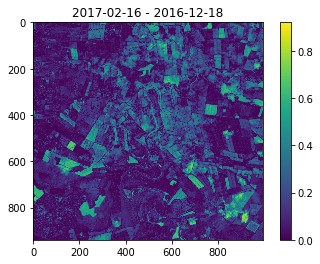

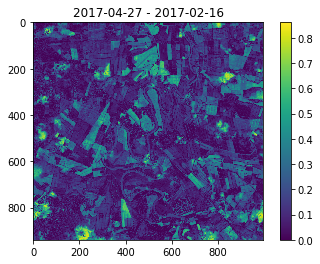

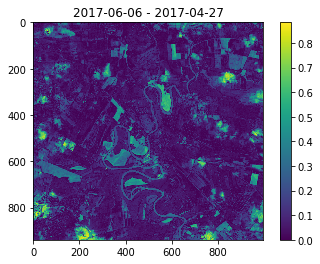

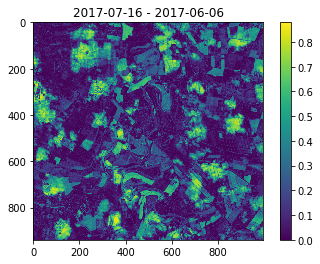

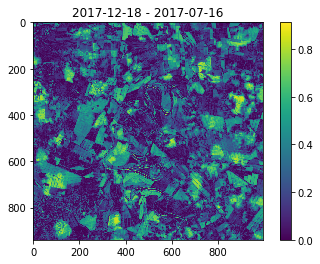

...

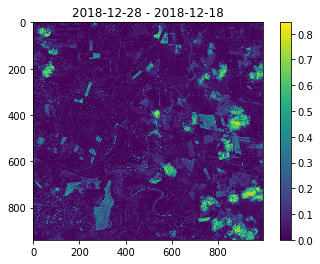

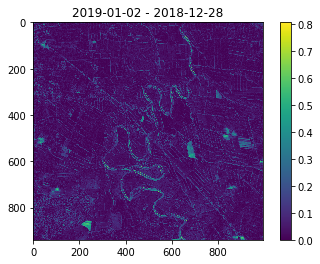

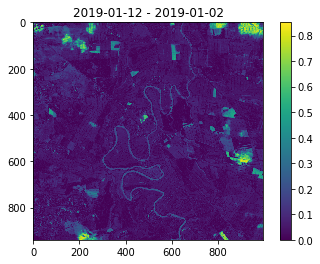

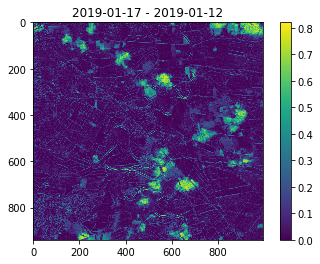

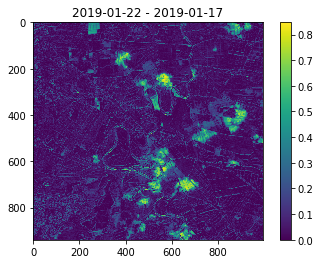

In [64]:
dates = [str(x.values)[:10] for x in s2_data.date]
for i in range(1, len(s2_data.date)):
    plt.title('{} - {}'.format(dates[i], dates[i-1]))
    plt.imshow(np.abs(NDVI(s2_data.reflectance.isel(date=i)) - NDVI(s2_data.reflectance.isel(date=i-1))),cmap='viridis') 
    plt.colorbar()
    plt.show()